# 信用情報の学習

## 【問題1】コンペティション内容の確認
コンペティションのOverviewページ読み、「Home Credit Default Risk」について以下の観点について確認してください。


- 何を学習し、何を予測するのか
- どのようなファイルを作りKaggleに提出するか
- 提出されたものはどういった指標値で評価されるのか

### 【問題1 解答】
- 何を学習し、何を予測するのか
      各顧客の収入やローン、住居等に関する個人情報を学習し、ローンの返済能力の有無（TARGET変数）を予測
- どのようなファイルを作りKaggleに提出するか
      下記のようにSK_ID_CURRごとにTARGET変数の確率を予測し、一覧化したファイル。
        SK_ID_CURR,TARGET
        100001,0.1
        100005,0.9
        100013,0.2
- 提出されたものはどういった指標値で評価されるのか
      TARGET変数に関するROC曲線の下面積（AUC）

## 【問題2】学習と検証
データを簡単に分析、前処理し、学習、検証するまでの一連の流れを作成・実行してください。


検証にはこのコンペティションで使用される評価指標を用いるようにしてください。学習に用いる手法は指定しません。

In [1]:
# import numpy as np

# #google driveのモジュールをインポート
# from google.colab import drive
# #google driveのマウント
# drive.mount('/content/drive')

# csv_path = "drive/My Drive/DIVE INTO CODE/Week3/application_train.csv" # ファイル名（パス）を指定する
csv_path = "../Week3/DIC_Week3_CreditInfoAnalysis/application_train.csv" # 学習用のファイル名（パス）を指定する

import pandas as pd
df = pd.read_csv(csv_path)
df = df.iloc[:1000, :]   #データ数を削減（データ数が10000以上の場合、学習に非常に時間がかかる）

In [2]:
%%time

pd.set_option("display.max_columns", 100)   #列数が130以上の場合、表示を省略
pd.set_option("display.max_rows", 130)   #行数が130以上の場合、表示を省略

print("df.head():")
display(df.head())
print("\n")
#df.info()
print("df.dtypes:")
display(df.dtypes)
print("\n")
print("df.describe()")
display(df.describe())
print("\n")
print("df.isnull():")
display(df.isnull())
print("\n")
print("df.sum():")
display(df.sum())
print("\n")
print("df.isnull().sum():")
display(df.isnull().sum())

df.head():


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,...,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,...,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,...,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single /



df.dtypes:


SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64




df.describe()


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,...,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,9.990000e+02,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,335.000000,1000.0,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,424.000000,997.000000,791.000000,505.000000,426.000000,521.000000,342.000000,303.000000,479.00000,512.000000,521.000000,323.000000,402.000000,318.000000,511.000000,311.000000,465.000000,505.000000,426.000000,521.000000,342.000000,...,318.000000,511.000000,311.000000,465.000000,505.000000,426.000000,521.000000,342.000000,303.000000,479.000000,512.000000,521.000000,323.000000,402.000000,318.000000,511.000000,311.000000,465.000000,531.000000,996.000000,996.000000,996.000000,996.000000,1000.000000,1000.0,1000.00000,1000.0,1000.000000,1000.000000,1000.0,1000.000000,1000.000000,1000.0,1000.000000,1000.0,1000.000000,1000.000000,1000.000000,1000.000000,1000.0,1000.000000,1000.0,1000.0,1000.0,856.000000,856.000000,856.000000,856.000000,856.000000,856.000000
mean,100575.487000,0.070000,0.406000,167660.480655,5.953064e+05,27120.672000,5.361982e+05,0.021132,-15872.74800,55733.906000,-4887.021000,-2935.102000,12.388060,1.0,0.842000,0.212000,0.997000,0.297000,0.064000,2.12900,2.042000,2.016000,11.975000,0.018000,0.057000,0.045000,0.084000,0.250000,0.19300,0.500541,0.515815,0.513224,0.112891,0.086210,0.979986,0.750607,0.039085,0.07942,0.141881,0.228145,0.237123,0.064893,0.094166,0.104910,0.007958,0.031158,0.109272,0.085563,0.977572,0.757567,...,0.097542,0.103349,0.007210,0.030850,0.113557,0.085843,0.980565,0.753667,0.039308,0.078873,0.141796,0.227854,0.236839,0.065572,0.095259,0.106562,0.007910,0.031508,0.100453,1.310241,0.126506,1.293173,0.087349,-980.529000,0.0,0.72300,0.0,0.017000,0.066000,0.0,0.085000,0.004000,0.0,0.003000,0.0,0.002000,0.002000,0.001000,0.010000,0.0,0.005000,0.0,0.0,0.0,0.009346,0.007009,0.036215,0.231308,0.290888,1.900701
std,331.664661,0.255275,0.713914,90167.625149,3.884752e+05,14278.923334,3.596362e+05,0.014033,4235.85437,134159.108526,3526.753088,1514.747449,13.774657,0.0,0.36492



df.isnull():


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,...,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,Tru



df.sum():


SK_ID_CURR                                                              100575487
TARGET                                                                         70
NAME_CONTRACT_TYPE              Cash loansCash loansRevolving loansCash loansC...
CODE_GENDER                     MFMFMMFMFMFFFMFMMFFFMFFFMFFMMMFFFMFFFMFMMFFFMF...
FLAG_OWN_CAR                    NNYNNNYYNNNNNYNYNNNNYYNNYNNNYNNNNYNNNNNYNNNNNN...
FLAG_OWN_REALTY                 YNYYYYYYYYYYYNYYNYYYYYNYNYYYYYYYNNYNYYYYYYNYYY...
CNT_CHILDREN                                                                  406
AMT_INCOME_TOTAL                                                    167660480.655
AMT_CREDIT                                                            595306363.5
AMT_ANNUITY                                                            27120672.0
AMT_GOODS_PRICE                                                       535662000.0
NAME_INCOME_TYPE                WorkingState servantWorkingWorkingWorkingState...
NAME_EDUCATION_T



df.isnull().sum():


SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
FLAG_OWN_REALTY                   0
CNT_CHILDREN                      0
AMT_INCOME_TOTAL                  0
AMT_CREDIT                        0
AMT_ANNUITY                       0
AMT_GOODS_PRICE                   1
NAME_TYPE_SUITE                   2
NAME_INCOME_TYPE                  0
NAME_EDUCATION_TYPE               0
NAME_FAMILY_STATUS                0
NAME_HOUSING_TYPE                 0
REGION_POPULATION_RELATIVE        0
DAYS_BIRTH                        0
DAYS_EMPLOYED                     0
DAYS_REGISTRATION                 0
DAYS_ID_PUBLISH                   0
OWN_CAR_AGE                     665
FLAG_MOBIL                        0
FLAG_EMP_PHONE                    0
FLAG_WORK_PHONE                   0
FLAG_CONT_MOBILE                  0
FLAG_PHONE                        0
FLAG_EMAIL                  

Wall time: 658 ms


Wall time: 1.08 s


<AxesSubplot:>

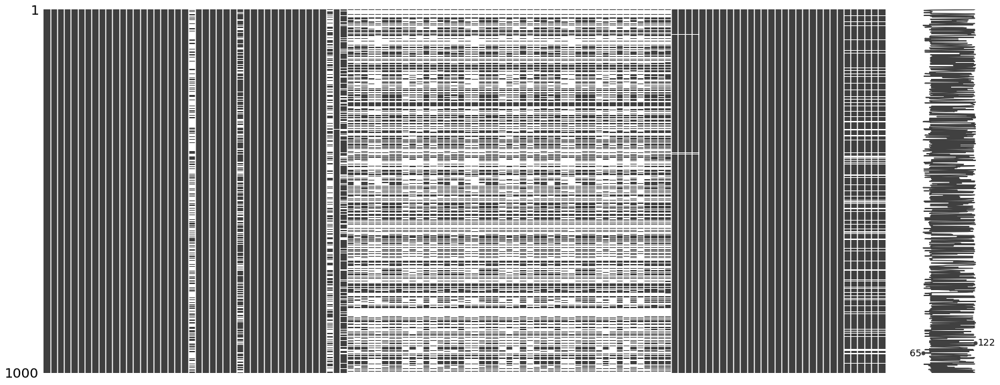

In [3]:
%%time

import missingno as msno

#各特徴量の欠損値の有無を確認する。
msno.matrix(df)

SK_ID_CURR                       0.0
TARGET                           0.0
NAME_CONTRACT_TYPE               0.0
CODE_GENDER                      0.0
FLAG_OWN_CAR                     0.0
FLAG_OWN_REALTY                  0.0
CNT_CHILDREN                     0.0
AMT_INCOME_TOTAL                 0.0
AMT_CREDIT                       0.0
AMT_ANNUITY                      0.0
AMT_GOODS_PRICE                  0.1
NAME_TYPE_SUITE                  0.2
NAME_INCOME_TYPE                 0.0
NAME_EDUCATION_TYPE              0.0
NAME_FAMILY_STATUS               0.0
NAME_HOUSING_TYPE                0.0
REGION_POPULATION_RELATIVE       0.0
DAYS_BIRTH                       0.0
DAYS_EMPLOYED                    0.0
DAYS_REGISTRATION                0.0
DAYS_ID_PUBLISH                  0.0
OWN_CAR_AGE                     66.5
FLAG_MOBIL                       0.0
FLAG_EMP_PHONE                   0.0
FLAG_WORK_PHONE                  0.0
FLAG_CONT_MOBILE                 0.0
FLAG_PHONE                       0.0
F

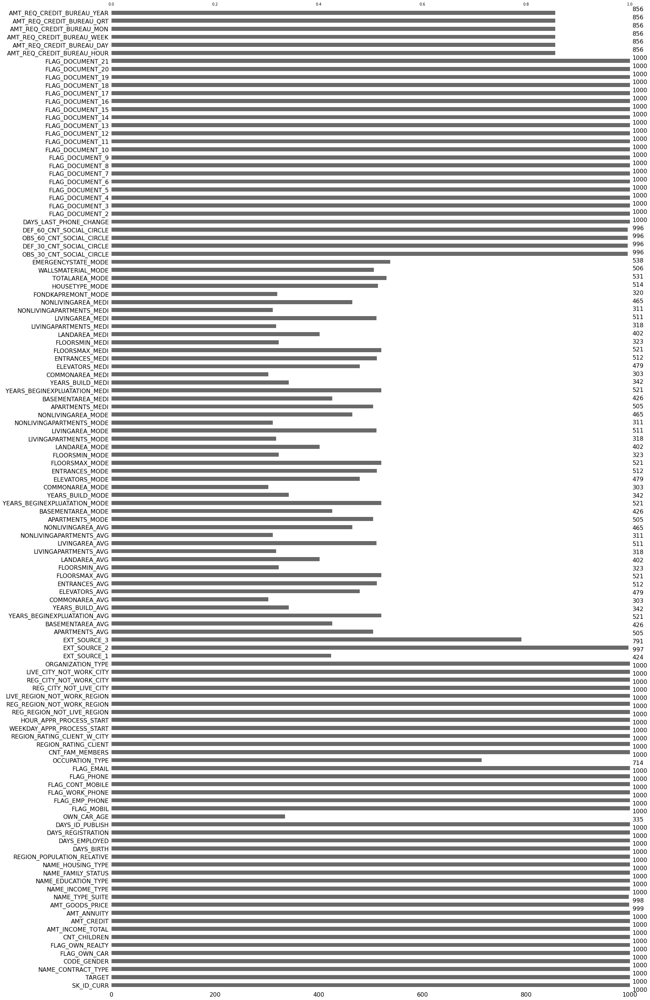

In [4]:
msno.bar(df)

#欠損値が何パーセント含まれるかを確認する。
null_rate = (df.isnull().sum() / df.shape[0]) * 100
print(null_rate)

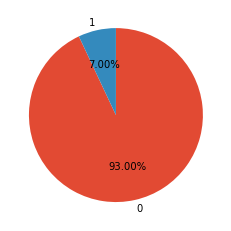

In [5]:
import matplotlib.pyplot as plt
import matplotlib.style
%matplotlib inline
matplotlib.style.use('ggplot')


#各ラベルの割合の円グラフを描画
#fig1, ax1 = plt.subplots(figsize=(8, 10), dpi=70)
fig0, ax0 = plt.subplots()

#labes_list = [0, 1] #TARGET変数の種類
target_ser = pd.Series(df.loc[:, "TARGET"])
value_count_ser = target_ser.value_counts()   #TARGET変数の各値のデータ数をカウント
ax0.pie(value_count_ser, labels=value_count_ser.index, startangle=90, counterclock=False, autopct="%1.2f%%");

In [6]:
#欠損値の多い列を削除し、欠損値を含む行を削除
null_num_ser = df.isnull().sum()
df2 = df.copy()

#全データ数の1/4以上の数の欠損値がある特徴量（列）は削除する。
threshold_del = df2.shape[0] / 4

for key in df.columns:
    if (null_num_ser[key] >= threshold_del ):
        df2 = df2.drop(labels=key, axis=1)
        
        
#データの値が文字列の列について、データを数値へ置換する
types_ser = df2.dtypes

for key in df2.columns:
    if (types_ser[key] == "object"):    #データ値が文字列型の列を検索
        #print(key)
        #print(df4.loc[:, key].nunique())
        df2.loc[:, key] = df2.loc[:, key].factorize()[0]    #データ値を文字列⇒数値型へ置換
        

pd.set_option("display.max_rows", 130)   #行数が130以上の場合、表示を省略

print("\n")
print("df2(欠損の多い列を削除後):")
display(df2)
print("df2.isnull().sum()")
display(df2.isnull().sum())

#欠損値があるサンプル（行）は削除する。
df2 = df2.dropna()

print("\n")
print("df2(欠損を含む行を削除後):")
display(df2)
display(df2.isnull().sum())



df2(欠損の多い列を削除後):


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,0,0,0,0,202500.0,406597.5,24700.5,351000.0,0,0,0,0,0,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,1.0,2,2,0,10,0,0,0,0,0,0,0,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,1,0,1,0,270000.0,1293502.5,35698.5,1129500.0,1,1,1,1,0,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,2.0,1,1,1,11,0,0,0,0,0,0,1,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,1,0,1,0,0,67500.0,135000.0,6750.0,135000.0,0,0,0,0,0,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,1.0,2,2,1,9,0,0,0,0,0,0,2,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,1,0,0,0,135000.0,312682.5,29686.5,297000.0,0,0,0,2,0,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,2.0,2,2,0,17,0,0,0,0,0,0,0,0.650442,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,0,0,0,0,121500.0,513000.0,21865.5,513000.0,0,0,0,0,0,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,1.0,2,2,2,11,0,0,0,0,1,1,3,0.322738,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,101152,0,0,1,0,1,0,112500.0,495985.5,17946.0,409500.0,0,3,0,3,0,0.010006,-21202,365243,-6542.0,-4011,1,0,0,1,1,0,1.0,2,2,5,7,0,0,0,0,0,0,5,0.610743,0.619528,4.0,0.0,4.0,0.0,-1912.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
996,101153,0,0,1,0,0,0,225000.0,1113840.0,57001.5,900000.0,0,2,0,0,0,0.046220,-14075,-901,-8049.0,-4181,1,1,0,1,0,0,1.0,1,1,2,15,0,0,0,1,1,1,27,0.451694,0.380800,0.0,0.0,0.0,0.0,-536.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
997,101154,0,0,1,1,0,0,144000.0,517536.0,28206.0,432000.0,0,3,0,1,0,0.007020,-21027,365243,-12357.0,-4466,1,0,0,1,0,0,2.0,2,2,5,10,0,0,0,0,0,0,5,0.675446,0.624615,0.0,0.0,0.0,0.0,-2340.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
998,101155,0,0,0,0,0,0,315000.0,1288350.0,37800.0,1125000.0,0,2,1,1,0,0.024610,-16204,-1461,-1046.0,-1216,1,1,1,1,0,0,2.0,2,2,1,15,0,0,0,0,0,0,7,0.551400,0.295583,0.0,0.0,0.0,0.0,-631.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,1.0,1.0


df2.isnull().sum()


SK_ID_CURR                       0
TARGET                           0
NAME_CONTRACT_TYPE               0
CODE_GENDER                      0
FLAG_OWN_CAR                     0
FLAG_OWN_REALTY                  0
CNT_CHILDREN                     0
AMT_INCOME_TOTAL                 0
AMT_CREDIT                       0
AMT_ANNUITY                      0
AMT_GOODS_PRICE                  1
NAME_TYPE_SUITE                  0
NAME_INCOME_TYPE                 0
NAME_EDUCATION_TYPE              0
NAME_FAMILY_STATUS               0
NAME_HOUSING_TYPE                0
REGION_POPULATION_RELATIVE       0
DAYS_BIRTH                       0
DAYS_EMPLOYED                    0
DAYS_REGISTRATION                0
DAYS_ID_PUBLISH                  0
FLAG_MOBIL                       0
FLAG_EMP_PHONE                   0
FLAG_WORK_PHONE                  0
FLAG_CONT_MOBILE                 0
FLAG_PHONE                       0
FLAG_EMAIL                       0
CNT_FAM_MEMBERS                  0
REGION_RATING_CLIENT



df2(欠損を含む行を削除後):


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,0,0,0,0,202500.0,406597.5,24700.5,351000.0,0,0,0,0,0,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,1.0,2,2,0,10,0,0,0,0,0,0,0,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
2,100004,0,1,0,1,0,0,67500.0,135000.0,6750.0,135000.0,0,0,0,0,0,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,1.0,2,2,1,9,0,0,0,0,0,0,2,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
5,100008,0,0,0,0,0,0,99000.0,490495.5,27517.5,454500.0,2,1,0,1,0,0.035792,-16941,-1588,-4970.0,-477,1,1,1,1,1,0,2.0,2,2,0,16,0,0,0,0,0,0,4,0.354225,0.621226,0.0,0.0,0.0,0.0,-2536.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
6,100009,0,0,1,1,0,1,171000.0,1560726.0,41301.0,1395000.0,0,2,1,1,0,0.035792,-13778,-3130,-1213.0,-619,1,1,0,1,1,0,3.0,2,2,3,16,0,0,0,0,0,0,0,0.724000,0.492060,1.0,0.0,1.0,0.0,-1562.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,1.0,2.0
7,100010,0,0,0,1,0,0,360000.0,1530000.0,42075.0,1530000.0,0,1,1,1,0,0.003122,-18850,-449,-4597.0,-2379,1,1,1,1,0,0,2.0,3,3,1,16,0,0,0,0,1,1,4,0.714279,0.540654,2.0,0.0,2.0,0.0,-1070.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,101152,0,0,1,0,1,0,112500.0,495985.5,17946.0,409500.0,0,3,0,3,0,0.010006,-21202,365243,-6542.0,-4011,1,0,0,1,1,0,1.0,2,2,5,7,0,0,0,0,0,0,5,0.610743,0.619528,4.0,0.0,4.0,0.0,-1912.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
996,101153,0,0,1,0,0,0,225000.0,1113840.0,57001.5,900000.0,0,2,0,0,0,0.046220,-14075,-901,-8049.0,-4181,1,1,0,1,0,0,1.0,1,1,2,15,0,0,0,1,1,1,27,0.451694,0.380800,0.0,0.0,0.0,0.0,-536.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
997,101154,0,0,1,1,0,0,144000.0,517536.0,28206.0,432000.0,0,3,0,1,0,0.007020,-21027,365243,-12357.0,-4466,1,0,0,1,0,0,2.0,2,2,5,10,0,0,0,0,0,0,5,0.675446,0.624615,0.0,0.0,0.0,0.0,-2340.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
998,101155,0,0,0,0,0,0,315000.0,1288350.0,37800.0,1125000.0,0,2,1,1,0,0.024610,-16204,-1461,-1046.0,-1216,1,1,1,1,0,0,2.0,2,2,1,15,0,0,0,0,0,0,7,0.551400,0.295583,0.0,0.0,0.0,0.0,-631.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,1.0,1.0


SK_ID_CURR                     0
TARGET                         0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
AMT_GOODS_PRICE                0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
FLAG_MOBIL                     0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT           0
REGION_RATING_CLIENT_W_CITY    0
WEEKDAY_AP

In [7]:
%%time

#相関行列
display("df2.corr():")
display(df2.corr())

'df2.corr():'

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,1.000000,0.030144,-0.033320,0.066895,0.072508,0.018264,0.004684,-0.034675,-0.015183,0.005554,-0.006330,-0.020814,-0.046401,0.003199,-0.021183,-0.035991,0.010106,0.043477,-0.033603,-0.031065,0.009364,NaN,0.034342,-0.012042,0.073268,-0.035976,-0.009922,0.009891,-0.008523,0.000063,0.010874,0.023800,-0.024719,-0.022448,-0.028591,0.039767,-0.000169,-0.007991,0.038189,-0.018280,0.021590,0.027382,-0.009293,0.027599,0.016381,-0.056263,NaN,0.024693,NaN,0.058363,-0.019421,NaN,-0.064026,0.059332,NaN,0.027646,NaN,NaN,-0.060818,0.009756,-0.071090,NaN,-0.045283,NaN,NaN,NaN,-0.048578,-0.026973,0.037712,0.015196,-0.006183,0.052710
TARGET,0.030144,1.000000,-0.029521,-0.079544,-0.029145,0.003429,0.017585,0.012970,-0.003830,0.030614,-0.014095,-0.033390,-0.008943,-0.076844,-0.026719,-0.033012,-0.000680,0.099750,-0.032189,0.032462,0.087128,NaN,0.034363,0.067423,0.013563,-0.006198,-0.010244,-0.017579,0.049588,0.044033,-0.028450,-0.016403,0.036703,0.028266,0.049844,-0.006951,0.061661,0.053341,0.013168,-0.183749,-0.235638,0.013513,0.017870,0.015764,0.016602,0.079988,NaN,0.000088,NaN,-0.036163,0.025774,NaN,0.042278,-0.016622,NaN,-0.016622,NaN,NaN,-0.013563,-0.009585,0.023313,NaN,0.065653,NaN,NaN,NaN,0.028544,0.024515,-0.020551,0.067563,-0.027043,-0.015681
NAME_CONTRACT_TYPE,-0.033320,-0.029521,1.000000,-0.074342,-0.019606,-0.082945,-0.003104,0.053841,-0.214456,-0.225314,-0.178204,0.062493,-0.056786,0.032382,-0.025141,-0.021151,0.039591,0.052486,-0.074453,0.024161,0.046484,NaN,0.074087,-0.032600,-0.162824,0.023572,-0.046284,0.001025,-0.083783,-0.079125,0.032195,0.013815,0.022503,-0.012023,-0.039678,-0.011406,-0.027907,-0.033294,-0.021505,0.070013,0.004072,-0.003320,-0.019957,-0.003064,-0.046152,0.068378,NaN,-0.466270,NaN,0.026258,-0.084974,NaN,-0.086624,-0.019176,NaN,-0.019176,NaN,NaN,-0.015647,-0.011057,-0.031415,NaN,0.053731,NaN,NaN,NaN,-0.029367,-0.019176,-0.008172,-0.044125,-0.097285,-0.081720
CODE_GENDER,0.066895,-0.079544,-0.074342,1.000000,-0.333903,0.014108,-0.069931,-0.240913,-0.057197,-0.088872,-0.060422,0.038151,0.125643,0.051837,0.158802,-0.037582,-0.042112,-0.179520,0.136109,-0.167706,-0.043628,NaN,-0.138286,-0.092073,-0.036992,0.022763,0.023283,-0.090111,0.071277,0.067841,0.052873,0.001558,-0.073256,-0.175972,-0.180402,-0.099596,-0.159476,-0.134256,0.040851,0.039715,0.009171,0.041053,0.032371,0.038345,0.020194,-0.067096,NaN,0.140932,NaN,-0.042500,0.096361,NaN,-0.216770,0.002088,NaN,-0.041159,NaN,NaN,0.036992,-0.048670,0.021133,NaN,0.002088,NaN,NaN,NaN,-0.015725,0.002088,0.032139,-0.020599,0.054462,0.047122
FLAG_OWN_CAR,0.072508,-0.029145,-0.019606,-0.333903,1.000000,-0.022800,0.119170,0.255785,0.118959,0.146318,0.125601,0.

Wall time: 274 ms


X_train
     EXT_SOURCE_3  AMT_GOODS_PRICE
59       0.339288        1129500.0
545      0.798137         913500.0
79       0.452534          90000.0
101      0.121408         675000.0
279      0.638044         225000.0
..            ...              ...
970      0.000527         360000.0
234      0.183035         180000.0
806      0.517297         270000.0
719      0.475850         450000.0
873      0.691021         900000.0

[590 rows x 2 columns]


X_test
     EXT_SOURCE_3  AMT_GOODS_PRICE
828      0.474051         675000.0
110      0.120641         585000.0
788      0.544235         688500.0
398      0.511892         238500.0
382      0.785052         112500.0
..            ...              ...
922      0.486653         306000.0
209      0.454321         135000.0
229      0.713631         900000.0
964      0.662638         630000.0
598      0.554947         360000.0

[197 rows x 2 columns]


y_train
59     0
545    0
79     0
101    0
279    0
      ..
970    1
234    0
806    0
719 

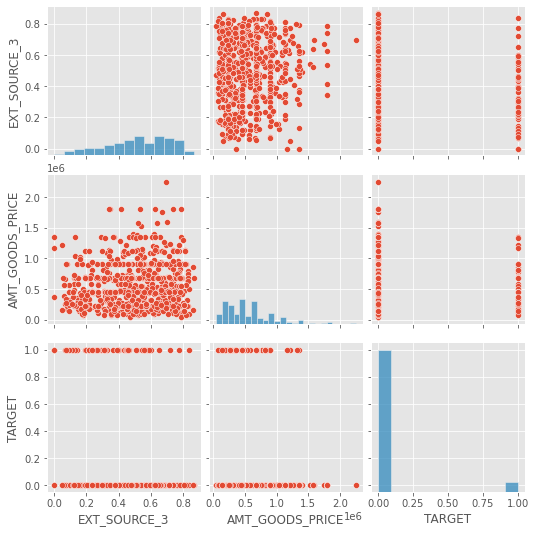

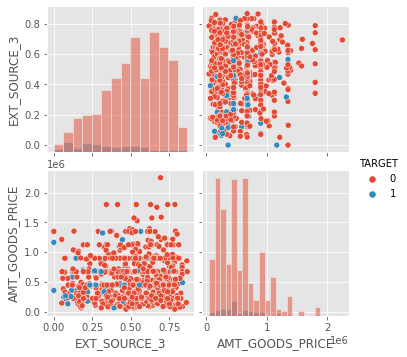

In [8]:
###学習用データ準備###

column_list = ["EXT_SOURCE_3", "AMT_GOODS_PRICE", "TARGET"]
df3 = df2.loc[:, column_list]

#散布図行列を作成
import seaborn as sns
sns.pairplot(df3, diag_kind="hist")
sns.pairplot(df3, hue="TARGET", diag_kind="hist")

import numpy as np
from sklearn.model_selection import train_test_split

np.set_printoptions(threshold=1000)    #ndarrayの要素の表示数上限を1000に設定

#データセットを学習用と検証用に分割
X_train, X_test, y_train, y_test = train_test_split(df3.iloc[:, :-1], df3.iloc[:, -1], random_state=0, test_size=0.25)

print("X_train")
print(X_train)
print("\n")
print("X_test")
print(X_test)
print("\n")
print("y_train")
print(y_train)
print("\n")
print("y_test")
print(y_test)
print("\n")
print("y_train.sum()")
print(y_train.sum())
print("\n")
print("y_test.sum()")
print(y_test.sum())


#標準化
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)
print("\n")
print("scaler.mean_:")
print(scaler.mean_)
print("\n")
print("scaler.var_:")
print(scaler.var_)

X_train_transformed = scaler.transform(X_train)    #標準化されたX_train
X_test_transformed = scaler.transform(X_test)     #標準化されたX_test

In [9]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
def decision_region(X, y, model, step=0.01, title='decision region', xlabel='xlabel', ylabel='ylabel', target_names=['versicolor', 'virginica']):
    """
    2値分類を2次元の特徴量で学習したモデルの決定領域を描く。
    背景の色が学習したモデルによる推定値から描画される。
    散布図の点は訓練データまたは検証データである。
    Parameters
    ----------------
    X : ndarray, shape(n_samples, 2)
        特徴量
    y : ndarray, shape(n_samples,)
        ラベル
    model : object
        学習したモデルのインスンタスを入れる
    step : float, (default : 0.1)
        推定値を計算する間隔を設定する
    title : str
        グラフのタイトルの文章を与える
    xlabel, ylabel : str
        軸ラベルの文章を与える
    target_names= : list of str
        凡例の一覧を与える
    """
    # setting
    scatter_color = ['red', 'blue']
    contourf_color = ['pink', 'skyblue']
    n_class = 2
    # pred
    mesh_f0, mesh_f1  = np.meshgrid(np.arange(np.min(X[:,0])-0.5, np.max(X[:,0])+0.5, step), np.arange(np.min(X[:,1])-0.5, np.max(X[:,1])+0.5, step))
    mesh = np.c_[np.ravel(mesh_f0),np.ravel(mesh_f1)]
    y_pred = model.predict(mesh).reshape(mesh_f0.shape)
    # plot
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.contourf(mesh_f0, mesh_f1, y_pred, n_class-1, cmap=ListedColormap(contourf_color))
    plt.contour(mesh_f0, mesh_f1, y_pred, n_class-1, colors='y', linewidths=3, alpha=0.5)
    for i, target in enumerate(set(y)):
        plt.scatter(X[y==target][:, 0], X[y==target][:, 1], s=80, color=scatter_color[i], label=target_names[i], marker='o')
    patches = [mpatches.Patch(color=scatter_color[i], label=target_names[i]) for i in range(n_class)]
    plt.legend(handles=patches)
    plt.legend()
    plt.show()

###SVM###
y_predict:
[0 0 0 ... 0 0 0]
y_predict_proba:
[[0.93860657 0.06139343]
 [0.93488356 0.06511644]
 [0.93860827 0.06139173]
 ...
 [0.93599209 0.06400791]
 [0.93860208 0.06139792]
 [0.93849053 0.06150947]]


###Confusion matrix（混同行列）###
[[181   1]
 [ 14   1]]


,SVM1
Accuacy,0.923858
Precision,0.500000
Recall,0.066667
F1,0.117647


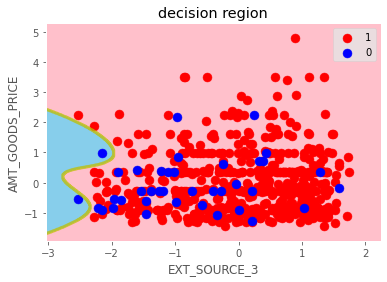

Wall time: 6.93 s


In [10]:
%%time

###SVM###
from sklearn import svm
from sklearn.datasets import load_iris

np.set_printoptions(threshold=100)    #ndarrayの要素の表示数上限を10000に設定

X = X_train_transformed
y = y_train

print("###SVM###")
# clf = svm.SVC(kernel="poly", C=1000, random_state=0, gamma="scale", probability=True)   #polyは時間がかかる
clf = svm.SVC(kernel="rbf", C=1000, random_state=0, gamma="scale", probability=True)
clf.fit(X, y)

y_predict = clf.predict(X_test_transformed)
y_predict_proba = clf.predict_proba(X_test_transformed)
print("y_predict:")
print(y_predict)
print("y_predict_proba:")
print(y_predict_proba)


# Accuracy（正解率）
from sklearn.metrics import accuracy_score
accuracy_score = accuracy_score(y_test, y_predict)

#Precision（適合率）
from sklearn.metrics import precision_score
precision_score = precision_score(y_test, y_predict)

#Recall（再現率）
from sklearn.metrics import recall_score
recall_score = recall_score(y_test, y_predict)

#F値
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_predict)

#Confusion matrix（混同行列）
from sklearn.metrics import confusion_matrix
print("\n")
print("###Confusion matrix（混同行列）###")
print(confusion_matrix(y_test, y_predict))

#指標値の比較用テーブルに登録
df_score = pd.DataFrame([accuracy_score, precision_score, recall_score, f1_score], index=["Accuacy", "Precision", "Recall", "F1"], columns=["SVM1"])
# df_score = pd.concat([df_score, df_score_temp], axis=1)
display(df_score)

# 決定領域を描画
decision_region(X_train_transformed, y_train, model=clf, step=0.01, title='decision region', xlabel=df3.columns[0], ylabel=df3.columns[1], target_names=df3.iloc[:, -1].unique())

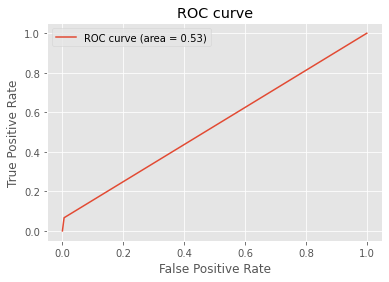

In [11]:
#ROC曲線、AUC
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict) # FPR（偽陽性率）、TPR（真陽性率）、閾値を算出
auc = metrics.auc(fpr, tpr)  # AUCを算出
plt.plot(fpr, tpr, label='ROC curve (area = %.2f)'%auc)
plt.legend()
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

### 【問題2 解答】
            SVM(Kernel=cbf, C=1000)で分類を行ったところ、TARGET変数のほぼ全てが"0"（返済能力あり）と出力された。
            AUCは0.53となり、非常に予測精度の低い結果となった。
            上記の決定領域図を見ると、TARGETが0と1の両方のクラスのデータが入り混じっている状態となっており、決定領域が
            ただしく描けていないことからも学習に用いた特徴量があまり適切でないことが窺える。
            特徴量を選択しなおすことが望ましい。

## 【問題3】テストデータに対する推定
テストデータ（application_test.csv）に対して推定を行い、Kaggleに提出を行ってください。


正しく提出が行えていれば、精度は低くても構いません。

In [12]:
###提出用テストデータを用いた分類###

#提出用テストデータの準備
# csv2_path = "drive/My Drive/DIVE INTO CODE/Week3/application_test.csv" # ファイル名（パス）を指定する
csv2_path = "../Week3/DIC_Week3_CreditInfoAnalysis/application_test.csv" # テスト用のファイル名（パス）を指定する
df_test_submit = pd.read_csv(csv2_path)


#データの値が文字列の列について、データを数値へ置換する
types_ser = df_test_submit.dtypes
for key in df_test_submit.columns:
    if (types_ser[key] == "object"):    #データ値が文字列型の列を検索
        #print(key)
        #print(df4.loc[:, key].nunique())
        df_test_submit.loc[:, key] = df_test_submit.loc[:, key].factorize()[0]    #データ値を文字列⇒数値型へ置換

df_test_submit = df_test_submit.fillna(df_test_submit.mean())  #提出用テストデータ内の欠損値を平均値に置換

df3_test_submit = df_test_submit.loc[:, column_list[:-1]]    #column_listに登録されている列（目的変数以外）を抽出
X_test_submit = np.array(df3_test_submit)    #提出用のテストデータ（X）をndarrayに変換
X_test_submit_transformed = scaler.transform(X_test_submit)     #標準化されたX_test_submit


#学習モデルを用いて提出用のTARGET変数の確率を算出
y_predict = clf.predict(X_test_submit_transformed)
y_predict_proba = clf.predict_proba(X_test_submit_transformed)
print("y_predict:")
print(y_predict)
print("y_predict_proba:")
print(y_predict_proba)

y_predict:
[0 0 0 ... 0 0 0]
y_predict_proba:
[[0.93667917 0.06332083]
 [0.93861961 0.06138039]
 [0.93861386 0.06138614]
 ...
 [0.93874387 0.06125613]
 [0.93862322 0.06137678]
 [0.93872461 0.06127539]]


In [13]:
pd.set_option("display.max_columns", 100)   #列数が100以上の場合、表示を省略
pd.set_option("display.max_rows", 100)   #行数が100以上の場合、表示を省略

#提出用のCSVを作成（application_test.csvの"SK_ID_CURR"に、"TARGET"の確率予測を結合）
df_submit_left = pd.DataFrame(df_test_submit.loc[:, "SK_ID_CURR"])
df_submit_right = pd.DataFrame(y_predict_proba[:, 1], columns=["TARGET"])
df_submit = pd.concat([df_submit_left, df_submit_right], axis=1)
print("提出用のCSVを作成")
display(df_submit)

df_submit.to_csv("submission.csv")  #CSVに出力

提出用のCSVを作成


,SK_ID_CURR,TARGET
0,100001,0.063321
1,100005,0.061380
2,100013,0.061386
3,100028,0.064464
4,100038,0.061397
...,...,...
48739,456221,0.061415
48740,456222,0.061343
48741,456223,0.061256
48742,456224,0.061377


### 【問題3 解答】
Kaggleに予測結果のCSVファイルを提出した。

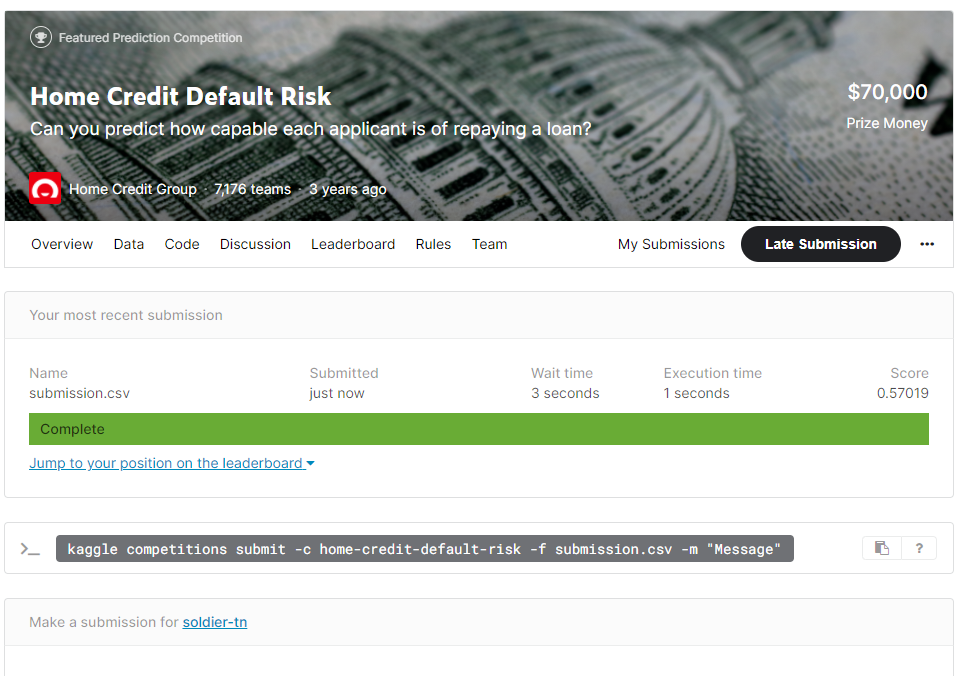

## 【問題4】特徴量エンジニアリング
精度を上げるために以下のような観点で 特徴量エンジニアリング（Feature Engineering） を行ってください。


- どの特徴量を使うか
- どう前処理をするか

何をした時に検証データに対する評価指標がどのようになったかをまとめてください。最低5パターンの学習・検証を行ってください。


精度が高かったものに関してはテストデータに対しても推定を行い、Kaggleに提出を行ってください。

### ■分類に活用できそうな特徴量を探す
下記の各散布図から、以下の特徴量が使えそう？
- EXT_SOURCE_2
- EXT_SOURCE_3
- DAYS_ID_PUBLISH
- DAYS_LAST_PHONE_CHANGE
- DAYS_REGISTRATION
- ORGANIZATION_TYPE

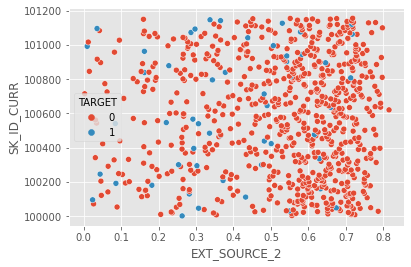

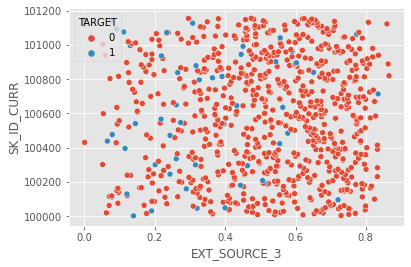

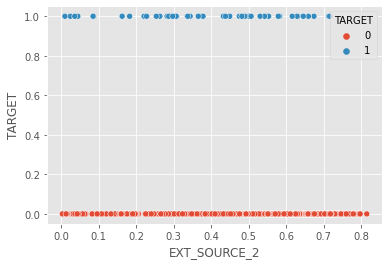

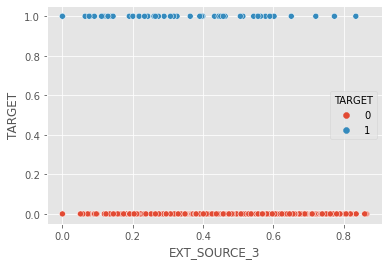

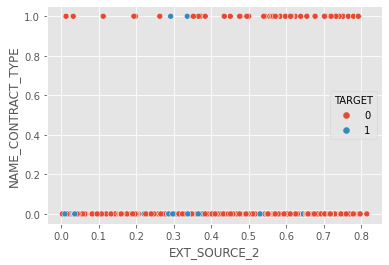

...

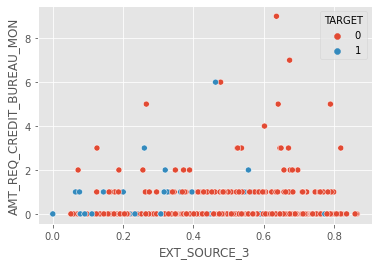

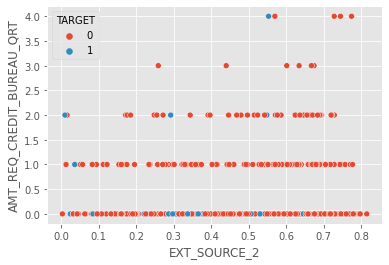

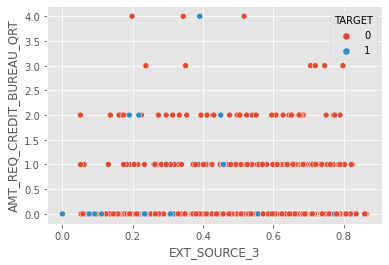

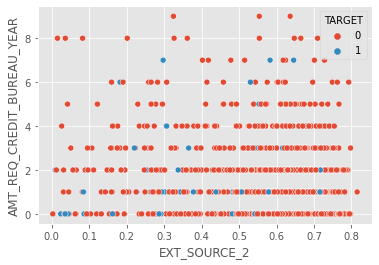

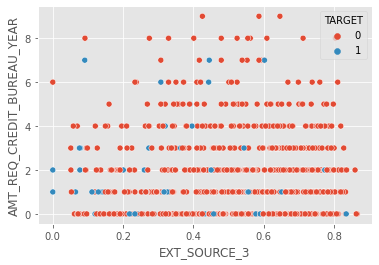

In [14]:
###EXT_SOURCE_3とそれ以外の特徴量との相関を確認###
column_list = ["EXT_SOURCE_2", "AMT_GOODS_PRICE"]

#散布図行列を作成
import seaborn as sns
for key in df2.columns:
#     sns.pairplot(df2.loc[:, ["EXT_SOURCE_3", key, "TARGET"]], hue="TARGET", diag_kind="hist");
    sns.scatterplot(data = df2, x="EXT_SOURCE_2", y=key, hue="TARGET")
    plt.show()
    sns.scatterplot(data = df2, x="EXT_SOURCE_3", y=key, hue="TARGET")
    plt.show()

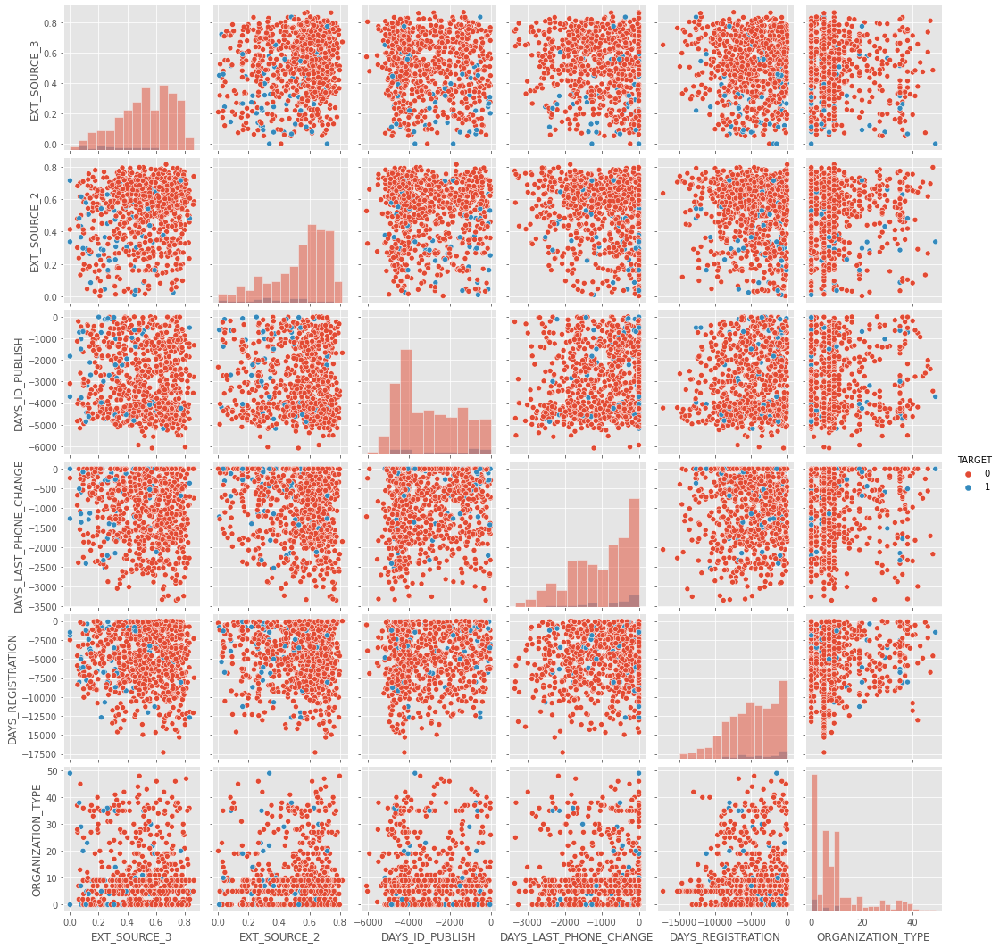

In [15]:
#上記の各散布図から、分類に活用できそうな特徴量に着目
column_list = ["EXT_SOURCE_3", "EXT_SOURCE_2", "DAYS_ID_PUBLISH", "DAYS_LAST_PHONE_CHANGE", "DAYS_REGISTRATION", "ORGANIZATION_TYPE", "TARGET"]
df3 = df2.loc[:, column_list]

#散布図行列を作成
import seaborn as sns
# sns.pairplot(df3, diag_kind="hist")
sns.pairplot(df3, hue="TARGET", diag_kind="hist");

### ■特徴量と学習の組み合わせを色々試す

In [16]:
import numpy as np
from sklearn.model_selection import train_test_split

np.set_printoptions(threshold=1000)    #ndarrayの要素の表示数上限を1000に設定

#データセットを学習用と検証用に分割
X_train, X_test, y_train, y_test = train_test_split(df3.iloc[:, :-1], df3.iloc[:, -1], random_state=0, test_size=0.25)
print("X_train")
display(X_train)
print("\n")
print("X_test")
display(X_test)
print("\n")
print("y_train")
display(y_train)
print("\n")
print("y_test")
display(y_test)
print("\n")
print("y_train.sum()")
display(y_train.sum())
print("\n")
print("y_test.sum()")
display(y_test.sum())

#標準化
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)

X_train_transformed = scaler.transform(X_train)    #標準化されたX_train
X_test_transformed = scaler.transform(X_test)     #標準化されたX_test


X_train


,EXT_SOURCE_3,EXT_SOURCE_2,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,ORGANIZATION_TYPE
59,0.339288,0.653597,-566,-1377.0,-6846.0,0
545,0.798137,0.411039,-1056,-1435.0,-760.0,9
79,0.452534,0.582735,-3442,-260.0,-12623.0,5
101,0.121408,0.169953,-367,-17.0,-4329.0,2
279,0.638044,0.731710,-2853,-1644.0,-7173.0,0
...,...,...,...,...,...,...
970,0.000527,0.715745,-1833,-1269.0,-1897.0,0
234,0.183035,0.195258,-1815,-70.0,-1219.0,8
806,0.517297,0.265107,-3232,-911.0,-2571.0,4
719,0.475850,0.656029,-2913,-1104.0,-318.0,38




X_test


,EXT_SOURCE_3,EXT_SOURCE_2,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,ORGANIZATION_TYPE
828,0.474051,0.265926,-3019,-928.0,-3022.0,5
110,0.120641,0.282069,-3190,-56.0,-387.0,23
788,0.544235,0.541830,-510,0.0,-12041.0,5
398,0.511892,0.262055,-4536,-1603.0,-7595.0,1
382,0.785052,0.096610,-4332,-861.0,-12295.0,5
...,...,...,...,...,...,...
922,0.486653,0.686500,-3027,-1.0,-9019.0,0
209,0.454321,0.394075,-2193,-1197.0,-689.0,0
229,0.713631,0.695817,-2290,-1388.0,-9761.0,0
964,0.662638,0.602603,-4248,-1044.0,-3372.0,35




y_train


59     0
545    0
79     0
101    0
279    0
      ..
970    1
234    0
806    0
719    0
873    0
Name: TARGET, Length: 590, dtype: int64



y_test


828    0
110    1
788    1
398    0
382    0
      ..
922    0
209    0
229    0
964    0
598    0
Name: TARGET, Length: 197, dtype: int64



y_train.sum()


38



y_test.sum()


15

#### ●SVM（kernel=rbf）、特徴量=EXT_SOURCE_2/EXT_SOURCE_3

###SVM###
y_predict:
[0 1 0 ... 0 0 0]
y_predict_proba:
[[0.93486477 0.06513523]
 [0.93321471 0.06678529]
 [0.93475287 0.06524713]
 ...
 [0.93476604 0.06523396]
 [0.93508624 0.06491376]
 [0.9347493  0.0652507 ]]


###Confusion matrix（混同行列）###
[[178   4]
 [ 14   1]]


,SVM1,SVM2
Accuacy,0.923858,0.908629
Precision,0.500000,0.200000
Recall,0.066667,0.066667
F1,0.117647,0.100000


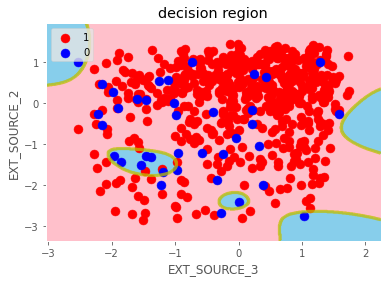

Wall time: 4.15 s


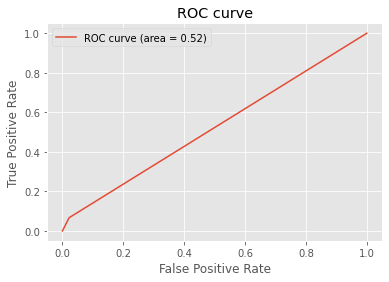

In [17]:
%%time

###SVM###
from sklearn import svm
from sklearn.datasets import load_iris

np.set_printoptions(threshold=100)    #ndarrayの要素の表示数上限を100に設定

X = X_train_transformed[:, [0,1]] #(["EXT_SOURCE_3", "EXT_SOURCE_2"]のみを抽出)
Xt = X_test_transformed[:, [0,1]] #(["EXT_SOURCE_3", "EXT_SOURCE_2"]のみを抽出)
y = y_train

print("###SVM###")
clf = svm.SVC(kernel="rbf", C=1000, random_state=0, gamma="scale", probability=True)   #polyは時間がかかる
clf.fit(X, y)

y_predict = clf.predict(Xt)
y_predict_proba = clf.predict_proba(Xt)
print("y_predict:")
print(y_predict)
print("y_predict_proba:")
print(y_predict_proba)


# Accuracy（正解率）
from sklearn.metrics import accuracy_score
accuracy_score = accuracy_score(y_test, y_predict)

#Precision（適合率）
from sklearn.metrics import precision_score
precision_score = precision_score(y_test, y_predict)

#Recall（再現率）
from sklearn.metrics import recall_score
recall_score = recall_score(y_test, y_predict)

#F値
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_predict)

#Confusion matrix（混同行列）
from sklearn.metrics import confusion_matrix
print("\n")
print("###Confusion matrix（混同行列）###")
print(confusion_matrix(y_test, y_predict))

#指標値の比較用テーブルに登録
df_score_temp = pd.DataFrame([accuracy_score, precision_score, recall_score, f1_score], index=["Accuacy", "Precision", "Recall", "F1"], columns=["SVM2"])
df_score = pd.concat([df_score, df_score_temp], axis=1)
display(df_score)


# 決定領域を描画
decision_region(X, y, model=clf, step=0.01, title='decision region', xlabel=df3.columns[0], ylabel=df3.columns[1], target_names=df3.iloc[:, -1].unique())


#ROC曲線、AUC
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict) # FPR（偽陽性率）、TPR（真陽性率）、閾値を算出
auc = metrics.auc(fpr, tpr)  # AUCを算出
plt.plot(fpr, tpr, label='ROC curve (area = %.2f)'%auc)
plt.legend()
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

#### ●SVM（kernel=sigmoid）、特徴量=EXT_SOURCE_2/EXT_SOURCE_3

###SVM###
y_predict:
[0 0 0 ... 0 0 0]
y_predict_proba:
[[0.92842731 0.07157269]
 [0.9408596  0.0591404 ]
 [0.93547368 0.06452632]
 ...
 [0.93136223 0.06863777]
 [0.93853727 0.06146273]
 [0.93984381 0.06015619]]


###Confusion matrix（混同行列）###
[[174   8]
 [ 13   2]]


,SVM1,SVM2,SVM3,KNN1,KNN2,KNN3,RandomForest1,RandomForest2,SVM3
Accuacy,0.923858,0.908629,0.893401,0.807107,0.862944,0.888325,0.908629,0.913706,0.893401
Precision,0.500000,0.200000,0.200000,0.074074,0.166667,0.181818,0.200000,0.000000,0.200000
Recall,0.066667,0.066667,0.133333,0.133333,0.200000,0.133333,0.066667,0.000000,0.133333
F1,0.117647,0.100000,0.160000,0.095238,0.181818,0.153846,0.100000,0.000000,0.160000


Wall time: 63 ms


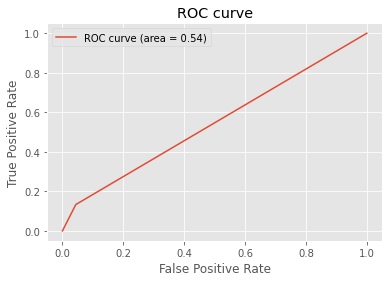

In [29]:
%%time

###SVM###
from sklearn import svm
from sklearn.datasets import load_iris

np.set_printoptions(threshold=100)    #ndarrayの要素の表示数上限を100に設定

X = X_train_transformed[:, [0,1]] #(["EXT_SOURCE_3", "EXT_SOURCE_2"]のみを抽出)
Xt = X_test_transformed[:, [0,1]] #(["EXT_SOURCE_3", "EXT_SOURCE_2"]のみを抽出)
y = y_train

print("###SVM###")
clf = svm.SVC(kernel="sigmoid", C=1000, random_state=0, gamma="scale", probability=True)   #polyは時間がかかる
clf.fit(X, y)

y_predict = clf.predict(Xt)
y_predict_proba = clf.predict_proba(Xt)
print("y_predict:")
print(y_predict)
print("y_predict_proba:")
print(y_predict_proba)


# Accuracy（正解率）
from sklearn.metrics import accuracy_score
accuracy_score = accuracy_score(y_test, y_predict)

#Precision（適合率）
from sklearn.metrics import precision_score
precision_score = precision_score(y_test, y_predict)

#Recall（再現率）
from sklearn.metrics import recall_score
recall_score = recall_score(y_test, y_predict)

#F値
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_predict)

#Confusion matrix（混同行列）
from sklearn.metrics import confusion_matrix
print("\n")
print("###Confusion matrix（混同行列）###")
print(confusion_matrix(y_test, y_predict))

#指標値の比較用テーブルに登録
df_score_temp = pd.DataFrame([accuracy_score, precision_score, recall_score, f1_score], index=["Accuacy", "Precision", "Recall", "F1"], columns=["SVM3"])
df_score = pd.concat([df_score, df_score_temp], axis=1)
display(df_score)


#ROC曲線、AUC
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict) # FPR（偽陽性率）、TPR（真陽性率）、閾値を算出
auc = metrics.auc(fpr, tpr)  # AUCを算出
plt.plot(fpr, tpr, label='ROC curve (area = %.2f)'%auc)
plt.legend()
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

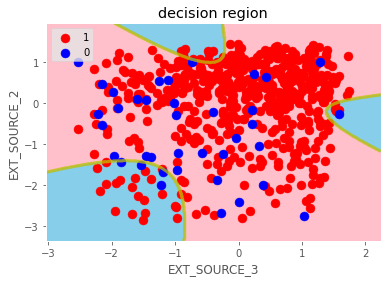

In [19]:
# 決定領域を描画
decision_region(X, y, model=clf, step=0.01, title='decision region', xlabel=df3.columns[0], ylabel=df3.columns[1], target_names=df3.iloc[:, -1].unique())

##### ※上記のモデルが2番目に指標値が高かったので、これを用いて提出用の予測確率を算出する

In [30]:
#学習モデルを用いて提出用のTARGET変数の確率を算出
y_predict = clf.predict(X_test_submit_transformed[:, 0:2])
y_predict_proba = clf.predict_proba(X_test_submit_transformed[:, 0:2])
print("y_predict:")
print(y_predict)
print("y_predict_proba:")
print(y_predict_proba)


pd.set_option("display.max_columns", 100)   #列数が100以上の場合、表示を省略
pd.set_option("display.max_rows", 100)   #行数が100以上の場合、表示を省略

#提出用のCSVを作成（application_test.csvの"SK_ID_CURR"に、"TARGET"の確率予測を結合）
df_submit_left = pd.DataFrame(df_test_submit.loc[:, "SK_ID_CURR"])
df_submit_right = pd.DataFrame(y_predict_proba[:, 1], columns=["TARGET"])
df_submit = pd.concat([df_submit_left, df_submit_right], axis=1)
print("提出用のCSVを作成")
display(df_submit)

df_submit.to_csv("submission_SVM3.csv")  #CSVに出力

y_predict:
[0 0 0 ... 0 0 0]
y_predict_proba:
[[0.93642757 0.06357243]
 [0.93163118 0.06836882]
 [0.9361123  0.0638877 ]
 ...
 [0.92798405 0.07201595]
 [0.92892348 0.07107652]
 [0.92788555 0.07211445]]
提出用のCSVを作成


,SK_ID_CURR,TARGET
0,100001,0.063572
1,100005,0.068369
2,100013,0.063888
3,100028,0.063905
4,100038,0.074521
...,...,...
48739,456221,0.063137
48740,456222,0.060592
48741,456223,0.072016
48742,456224,0.071077


#### ●KNN（k=1）、特徴量=EXT_SOURCE_2/EXT_SOURCE_3

y_predict:
[0 1 0 ... 0 0 1]
y_predict_proba:
[[1. 0.]
 [0. 1.]
 [1. 0.]
 ...
 [1. 0.]
 [1. 0.]
 [0. 1.]]


###Confusion matrix（混同行列）###
[[157  25]
 [ 13   2]]


,SVM1,SVM2,SVM3,KNN1
Accuacy,0.923858,0.908629,0.893401,0.807107
Precision,0.500000,0.200000,0.200000,0.074074
Recall,0.066667,0.066667,0.133333,0.133333
F1,0.117647,0.100000,0.160000,0.095238


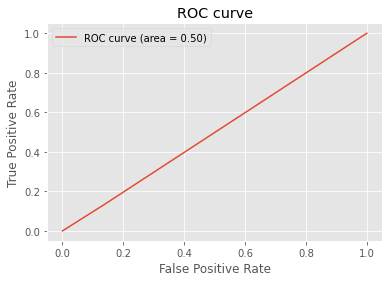

In [20]:
###KNN###
from sklearn.neighbors import KNeighborsClassifier

X = X_train_transformed[:, 0:2] #(["EXT_SOURCE_3", "EXT_SOURCE_2"]のみを抽出)
Xt = X_test_transformed[:, 0:2] #(["EXT_SOURCE_3", "EXT_SOURCE_2"]のみを抽出)
y = y_train

#k=1のk近傍法でyを予測
clf = KNeighborsClassifier(n_neighbors=1)
clf.fit(X, y)
y_predict = clf.predict(Xt)
y_predict_proba = clf.predict_proba(Xt)
print("y_predict:")
print(y_predict)
print("y_predict_proba:")
print(y_predict_proba)


# Accuracy（正解率）
from sklearn.metrics import accuracy_score
accuracy_score = accuracy_score(y_test, y_predict)

#Precision（適合率）
from sklearn.metrics import precision_score
precision_score = precision_score(y_test, y_predict)

#Recall（再現率）
from sklearn.metrics import recall_score
recall_score = recall_score(y_test, y_predict)

#F値
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_predict)

#Confusion matrix（混同行列）
from sklearn.metrics import confusion_matrix
print("\n")
print("###Confusion matrix（混同行列）###")
print(confusion_matrix(y_test, y_predict))

#指標値の比較用テーブルに登録
df_score_temp = pd.DataFrame([accuracy_score, precision_score, recall_score, f1_score], index=["Accuacy", "Precision", "Recall", "F1"], columns=["KNN1"])
df_score = pd.concat([df_score, df_score_temp], axis=1)
display(df_score)


#ROC曲線、AUC
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict) # FPR（偽陽性率）、TPR（真陽性率）、閾値を算出
auc = metrics.auc(fpr, tpr)  # AUCを算出
plt.plot(fpr, tpr, label='ROC curve (area = %.2f)'%auc)
plt.legend()
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

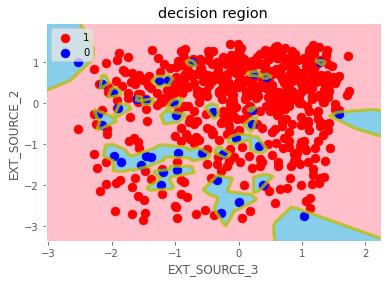

In [21]:
# 決定領域を描画
decision_region(X, y, model=clf, step=0.01, title='decision region', xlabel=df3.columns[0], ylabel=df3.columns[1], target_names=df3.iloc[:, -1].unique())

#### ●KNN（k=1）、特徴量=["EXT_SOURCE_3", "EXT_SOURCE_2", "DAYS_ID_PUBLISH"]

y_predict:
[0 0 0 ... 0 0 0]
y_predict_proba:
[[1. 0.]
 [1. 0.]
 [1. 0.]
 ...
 [1. 0.]
 [1. 0.]
 [1. 0.]]


###Confusion matrix（混同行列）###
[[167  15]
 [ 12   3]]


,SVM1,SVM2,SVM3,KNN1,KNN2
Accuacy,0.923858,0.908629,0.893401,0.807107,0.862944
Precision,0.500000,0.200000,0.200000,0.074074,0.166667
Recall,0.066667,0.066667,0.133333,0.133333,0.200000
F1,0.117647,0.100000,0.160000,0.095238,0.181818


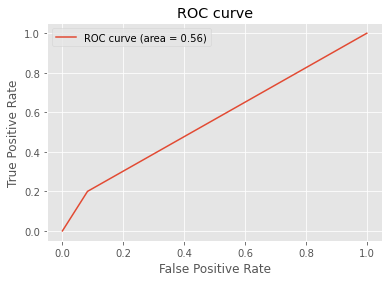

In [22]:
###KNN###
from sklearn.neighbors import KNeighborsClassifier

X = X_train_transformed[:, 0:3] #(["EXT_SOURCE_3", "EXT_SOURCE_2", "DAYS_ID_PUBLISH"]のみを抽出)
Xt = X_test_transformed[:, 0:3] #(["EXT_SOURCE_3", "EXT_SOURCE_2", "DAYS_ID_PUBLISH"]のみを抽出)
y = y_train

#k=1のk近傍法でyを予測
clf = KNeighborsClassifier(n_neighbors=1)
clf.fit(X, y)
y_predict = clf.predict(Xt)
y_predict_proba = clf.predict_proba(Xt)
print("y_predict:")
print(y_predict)
print("y_predict_proba:")
print(y_predict_proba)


# Accuracy（正解率）
from sklearn.metrics import accuracy_score
accuracy_score = accuracy_score(y_test, y_predict)

#Precision（適合率）
from sklearn.metrics import precision_score
precision_score = precision_score(y_test, y_predict)

#Recall（再現率）
from sklearn.metrics import recall_score
recall_score = recall_score(y_test, y_predict)

#F値
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_predict)

#Confusion matrix（混同行列）
from sklearn.metrics import confusion_matrix
print("\n")
print("###Confusion matrix（混同行列）###")
print(confusion_matrix(y_test, y_predict))

#指標値の比較用テーブルに登録
df_score_temp = pd.DataFrame([accuracy_score, precision_score, recall_score, f1_score], index=["Accuacy", "Precision", "Recall", "F1"], columns=["KNN2"])
df_score = pd.concat([df_score, df_score_temp], axis=1)
display(df_score)


#ROC曲線、AUC
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict) # FPR（偽陽性率）、TPR（真陽性率）、閾値を算出
auc = metrics.auc(fpr, tpr)  # AUCを算出
plt.plot(fpr, tpr, label='ROC curve (area = %.2f)'%auc)
plt.legend()
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

##### ※上記のモデルが最も指標値が高かったので、これを用いて提出用の予測確率を算出する

In [23]:
#データの値が文字列の列について、データを数値へ置換する
types_ser = df_test_submit.dtypes
for key in df_test_submit.columns:
    if (types_ser[key] == "object"):    #データ値が文字列型の列を検索
        #print(key)
        #print(df4.loc[:, key].nunique())
        df_test_submit.loc[:, key] = df_test_submit.loc[:, key].factorize()[0]    #データ値を文字列⇒数値型へ置換

df_test_submit = df_test_submit.fillna(df_test_submit.mean())  #提出用テストデータ内の欠損値を平均値に置換

df3_test_submit = df_test_submit.loc[:, column_list[:-1]]    #column_listに登録されている列（目的変数以外）を抽出
X_test_submit = np.array(df3_test_submit)    #提出用のテストデータ（X）をndarrayに変換
X_test_submit_transformed = scaler.transform(X_test_submit)     #標準化されたX_test_submit


#学習モデルを用いて提出用のTARGET変数の確率を算出
y_predict = clf.predict(X_test_submit_transformed[:, 0:3])
y_predict_proba = clf.predict_proba(X_test_submit_transformed[:, 0:3])
print("y_predict:")
print(y_predict)
print("y_predict_proba:")
print(y_predict_proba)


pd.set_option("display.max_columns", 100)   #列数が100以上の場合、表示を省略
pd.set_option("display.max_rows", 100)   #行数が100以上の場合、表示を省略

#提出用のCSVを作成（application_test.csvの"SK_ID_CURR"に、"TARGET"の確率予測を結合）
df_submit_left = pd.DataFrame(df_test_submit.loc[:, "SK_ID_CURR"])
df_submit_right = pd.DataFrame(y_predict_proba[:, 1], columns=["TARGET"])
df_submit = pd.concat([df_submit_left, df_submit_right], axis=1)
print("提出用のCSVを作成")
display(df_submit)

df_submit.to_csv("submission_KNN2.csv")  #CSVに出力

y_predict:
[0 1 0 ... 0 0 1]
y_predict_proba:
[[1. 0.]
 [0. 1.]
 [1. 0.]
 ...
 [1. 0.]
 [1. 0.]
 [0. 1.]]
提出用のCSVを作成


,SK_ID_CURR,TARGET
0,100001,0.0
1,100005,1.0
2,100013,0.0
3,100028,0.0
4,100038,0.0
...,...,...
48739,456221,0.0
48740,456222,0.0
48741,456223,0.0
48742,456224,0.0


#### ●KNN（k=1）、特徴量=["EXT_SOURCE_3", "EXT_SOURCE_2", "DAYS_ID_PUBLISH", "DAYS_LAST_PHONE_CHANGE", "DAYS_REGISTRATION", "ORGANIZATION_TYPE"]

y_predict:
[0 0 0 ... 0 0 0]
y_predict_proba:
[[1. 0.]
 [1. 0.]
 [1. 0.]
 ...
 [1. 0.]
 [1. 0.]
 [1. 0.]]


###Confusion matrix（混同行列）###
[[173   9]
 [ 13   2]]


,SVM1,SVM2,SVM3,KNN1,KNN2,KNN3
Accuacy,0.923858,0.908629,0.893401,0.807107,0.862944,0.888325
Precision,0.500000,0.200000,0.200000,0.074074,0.166667,0.181818
Recall,0.066667,0.066667,0.133333,0.133333,0.200000,0.133333
F1,0.117647,0.100000,0.160000,0.095238,0.181818,0.153846


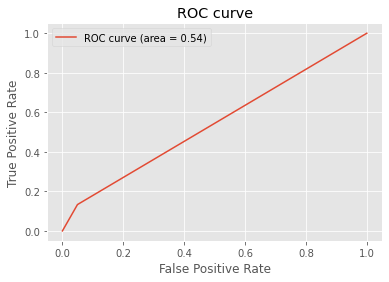

In [24]:
###KNN###
from sklearn.neighbors import KNeighborsClassifier

X = X_train_transformed
Xt = X_test_transformed
y = y_train

#k=1のk近傍法でyを予測
clf = KNeighborsClassifier(n_neighbors=1)
clf.fit(X, y)
y_predict = clf.predict(Xt)
y_predict_proba = clf.predict_proba(Xt)
print("y_predict:")
print(y_predict)
print("y_predict_proba:")
print(y_predict_proba)


# Accuracy（正解率）
from sklearn.metrics import accuracy_score
accuracy_score = accuracy_score(y_test, y_predict)

#Precision（適合率）
from sklearn.metrics import precision_score
precision_score = precision_score(y_test, y_predict)

#Recall（再現率）
from sklearn.metrics import recall_score
recall_score = recall_score(y_test, y_predict)

#F値
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_predict)

#Confusion matrix（混同行列）
from sklearn.metrics import confusion_matrix
print("\n")
print("###Confusion matrix（混同行列）###")
print(confusion_matrix(y_test, y_predict))

#指標値の比較用テーブルに登録
df_score_temp = pd.DataFrame([accuracy_score, precision_score, recall_score, f1_score], index=["Accuacy", "Precision", "Recall", "F1"], columns=["KNN3"])
df_score = pd.concat([df_score, df_score_temp], axis=1)
display(df_score)


#ROC曲線、AUC
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict) # FPR（偽陽性率）、TPR（真陽性率）、閾値を算出
auc = metrics.auc(fpr, tpr)  # AUCを算出
plt.plot(fpr, tpr, label='ROC curve (area = %.2f)'%auc)
plt.legend()
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

#### ●ランダムフォレスト、特徴量=["EXT_SOURCE_3", "EXT_SOURCE_2"]

###ランダムフォレスト###
y_predict:
[0 1 0 ... 0 0 0]
y_predict_proba:
[[0.99 0.01]
 [0.38 0.62]
 [0.96 0.04]
 ...
 [1.   0.  ]
 [1.   0.  ]
 [0.71 0.29]]


###Confusion matrix（混同行列）###
[[178   4]
 [ 14   1]]


,SVM1,SVM2,SVM3,KNN1,KNN2,KNN3,RandomForest1
Accuacy,0.923858,0.908629,0.893401,0.807107,0.862944,0.888325,0.908629
Precision,0.500000,0.200000,0.200000,0.074074,0.166667,0.181818,0.200000
Recall,0.066667,0.066667,0.133333,0.133333,0.200000,0.133333,0.066667
F1,0.117647,0.100000,0.160000,0.095238,0.181818,0.153846,0.100000


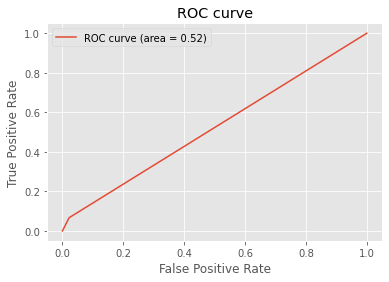

In [25]:
###ランダムフォレスト###
from sklearn.ensemble import RandomForestClassifier#ランダムフォレスト

X = X_train_transformed[:, 0:2] #(["EXT_SOURCE_3", "EXT_SOURCE_2"]のみを抽出)
Xt = X_test_transformed[:, 0:2] #(["EXT_SOURCE_3", "EXT_SOURCE_2"]のみを抽出)
y = y_train

print("###ランダムフォレスト###")
clf = RandomForestClassifier(random_state=0)
clf.fit(X, y)
y_predict = clf.predict(Xt)
y_predict_proba = clf.predict_proba(Xt)
print("y_predict:")
print(y_predict)
print("y_predict_proba:")
print(y_predict_proba)


# Accuracy（正解率）
from sklearn.metrics import accuracy_score
accuracy_score = accuracy_score(y_test, y_predict)

#Precision（適合率）
from sklearn.metrics import precision_score
precision_score = precision_score(y_test, y_predict)

#Recall（再現率）
from sklearn.metrics import recall_score
recall_score = recall_score(y_test, y_predict)

#F値
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_predict)

#Confusion matrix（混同行列）
from sklearn.metrics import confusion_matrix
print("\n")
print("###Confusion matrix（混同行列）###")
print(confusion_matrix(y_test, y_predict))

#指標値の比較用テーブルに登録
df_score_temp = pd.DataFrame([accuracy_score, precision_score, recall_score, f1_score], index=["Accuacy", "Precision", "Recall", "F1"], columns=["RandomForest1"])
df_score = pd.concat([df_score, df_score_temp], axis=1)
display(df_score)


#ROC曲線、AUC
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict) # FPR（偽陽性率）、TPR（真陽性率）、閾値を算出
auc = metrics.auc(fpr, tpr)  # AUCを算出
plt.plot(fpr, tpr, label='ROC curve (area = %.2f)'%auc)
plt.legend()
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

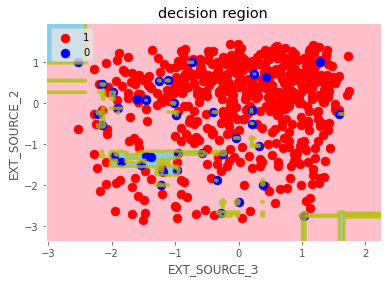

In [26]:
# 決定領域を描画
decision_region(X, y, model=clf, step=0.01, title='decision region', xlabel=df3.columns[0], ylabel=df3.columns[1], target_names=df3.iloc[:, -1].unique())

#### ●ランダムフォレスト、特徴量=["EXT_SOURCE_3", "EXT_SOURCE_2", "DAYS_ID_PUBLISH", "DAYS_LAST_PHONE_CHANGE", "DAYS_REGISTRATION", "ORGANIZATION_TYPE"]

###ランダムフォレスト###
y_predict:
[0 0 0 ... 0 0 0]
y_predict_proba:
[[0.96 0.04]
 [0.78 0.22]
 [0.82 0.18]
 ...
 [1.   0.  ]
 [0.95 0.05]
 [0.97 0.03]]


###Confusion matrix（混同行列）###
[[180   2]
 [ 15   0]]


,SVM1,SVM2,SVM3,KNN1,KNN2,KNN3,RandomForest1,RandomForest2
Accuacy,0.923858,0.908629,0.893401,0.807107,0.862944,0.888325,0.908629,0.913706
Precision,0.500000,0.200000,0.200000,0.074074,0.166667,0.181818,0.200000,0.000000
Recall,0.066667,0.066667,0.133333,0.133333,0.200000,0.133333,0.066667,0.000000
F1,0.117647,0.100000,0.160000,0.095238,0.181818,0.153846,0.100000,0.000000


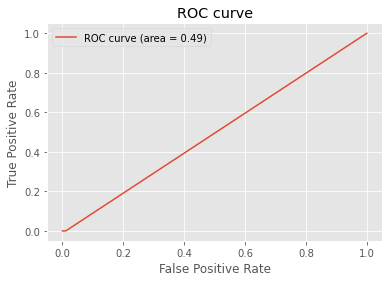

In [27]:
###ランダムフォレスト###
from sklearn.ensemble import RandomForestClassifier#ランダムフォレスト

X = X_train_transformed
Xt = X_test_transformed
y = y_train

print("###ランダムフォレスト###")
clf = RandomForestClassifier(random_state=0)
clf.fit(X, y)
y_predict = clf.predict(Xt)
y_predict_proba = clf.predict_proba(Xt)
print("y_predict:")
print(y_predict)
print("y_predict_proba:")
print(y_predict_proba)


# Accuracy（正解率）
from sklearn.metrics import accuracy_score
accuracy_score = accuracy_score(y_test, y_predict)

#Precision（適合率）
from sklearn.metrics import precision_score
precision_score = precision_score(y_test, y_predict)

#Recall（再現率）
from sklearn.metrics import recall_score
recall_score = recall_score(y_test, y_predict)

#F値
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_predict)

#Confusion matrix（混同行列）
from sklearn.metrics import confusion_matrix
print("\n")
print("###Confusion matrix（混同行列）###")
print(confusion_matrix(y_test, y_predict))

#指標値の比較用テーブルに登録
df_score_temp = pd.DataFrame([accuracy_score, precision_score, recall_score, f1_score], index=["Accuacy", "Precision", "Recall", "F1"], columns=["RandomForest2"])
df_score = pd.concat([df_score, df_score_temp], axis=1)
display(df_score)


#ROC曲線、AUC
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict) # FPR（偽陽性率）、TPR（真陽性率）、閾値を算出
auc = metrics.auc(fpr, tpr)  # AUCを算出
plt.plot(fpr, tpr, label='ROC curve (area = %.2f)'%auc)
plt.legend()
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

### 【問題4 解答】
- SVMで使用する特徴量の組み合わせを、["EXT_SOURCE_3", "AMT_GOODS_PRICE"]⇒[["EXT_SOURCE_3", "EXT_SOURCE_2"]に変更したことで、